In [102]:
# !pip install pandas shapely  geopandas
# !pip install netcdf4 xarray 

In [103]:
import pandas as pd  # dataframe package like as tabular data
import geopandas as gpd  #GIS Package for Vector(Point/Line/Polygon) Geometry
from shapely.geometry import Point, Polygon #package for Point, Polygon Geometry 

In [104]:
import os
import numpy as np    

In [105]:
# import chart visualization package
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial']  # or another font that works well on your system.

In [106]:
import xarray as xr  # Xarray is a Python package that can use multidimensional spatio-temporal data including NetCDF


In [107]:
ds = xr.open_dataset('sst.mon.mean.nc')  #load NetCDF
ds

<xarray.Dataset>
Dimensions:  (lat: 180, lon: 360, time: 1590)
Coordinates:
  * lat      (lat) float32 89.5 88.5 87.5 86.5 85.5 ... -86.5 -87.5 -88.5 -89.5
  * lon      (lon) float32 0.5 1.5 2.5 3.5 4.5 ... 355.5 356.5 357.5 358.5 359.5
  * time     (time) datetime64[ns] 1891-01-01 1891-02-01 ... 2023-06-01
Data variables:
    sst      (time, lat, lon) float32 ...
Attributes:
    title:            COBE Sea Surface Temperature Analysis
    history:          created June 2011 at ESRL/PSD using the grib data from ...
    platform:         Analyses
    original_source:  http://near-goos1.jodc.go.jp/cgi-bin/1997/near_goos_cat...
    Conventions:      CF-1.2
    institution:      NOAA ESRL/PSD
    comment:          recent values (w/i last year) may change as dataset is ...
    dataset_title:    COBE Sea Surface Temperature
    References:       https://www.psl.noaa.gov/data/gridded/data.cobe.html

In [108]:
# import package for deal with datetime data
import datetime

In [109]:
# extract the data by time - recent 2 years 
time_start = datetime.datetime(2022, 1, 1, 0, 0, 0)
time_end = datetime.datetime(2022, 12, 31, 23, 59, 59)
ds2 = ds.sel(time=slice(time_start, time_end))
ds2 

<xarray.Dataset>
Dimensions:  (lat: 180, lon: 360, time: 12)
Coordinates:
  * lat      (lat) float32 89.5 88.5 87.5 86.5 85.5 ... -86.5 -87.5 -88.5 -89.5
  * lon      (lon) float32 0.5 1.5 2.5 3.5 4.5 ... 355.5 356.5 357.5 358.5 359.5
  * time     (time) datetime64[ns] 2022-01-01 2022-02-01 ... 2022-12-01
Data variables:
    sst      (time, lat, lon) float32 ...
Attributes:
    title:            COBE Sea Surface Temperature Analysis
    history:          created June 2011 at ESRL/PSD using the grib data from ...
    platform:         Analyses
    original_source:  http://near-goos1.jodc.go.jp/cgi-bin/1997/near_goos_cat...
    Conventions:      CF-1.2
    institution:      NOAA ESRL/PSD
    comment:          recent values (w/i last year) may change as dataset is ...
    dataset_title:    COBE Sea Surface Temperature
    References:       https://www.psl.noaa.gov/data/gridded/data.cobe.html

In [110]:
# extract the data by spatial - zoom in asia 
min_lon = 120 
min_lat = 30
max_lon = 140
max_lat = 45
# mask the coordinates
mask_lon = (ds2.lon >= min_lon) & (ds2.lon <= max_lon)
mask_lat = (ds2.lat >= min_lat) & (ds2.lat <= max_lat)
# clip the dataset 
ds3 = ds2.where(mask_lon & mask_lat, drop=True)
ds3

<xarray.Dataset>
Dimensions:  (time: 12, lat: 15, lon: 20)
Coordinates:
  * lat      (lat) float32 44.5 43.5 42.5 41.5 40.5 ... 34.5 33.5 32.5 31.5 30.5
  * lon      (lon) float32 120.5 121.5 122.5 123.5 ... 136.5 137.5 138.5 139.5
  * time     (time) datetime64[ns] 2022-01-01 2022-02-01 ... 2022-12-01
Data variables:
    sst      (time, lat, lon) float32 nan nan nan nan ... 21.97 22.07 22.16
Attributes:
    title:            COBE Sea Surface Temperature Analysis
    history:          created June 2011 at ESRL/PSD using the grib data from ...
    platform:         Analyses
    original_source:  http://near-goos1.jodc.go.jp/cgi-bin/1997/near_goos_cat...
    Conventions:      CF-1.2
    institution:      NOAA ESRL/PSD
    comment:          recent values (w/i last year) may change as dataset is ...
    dataset_title:    COBE Sea Surface Temperature
    References:       https://www.psl.noaa.gov/data/gridded/data.cobe.html

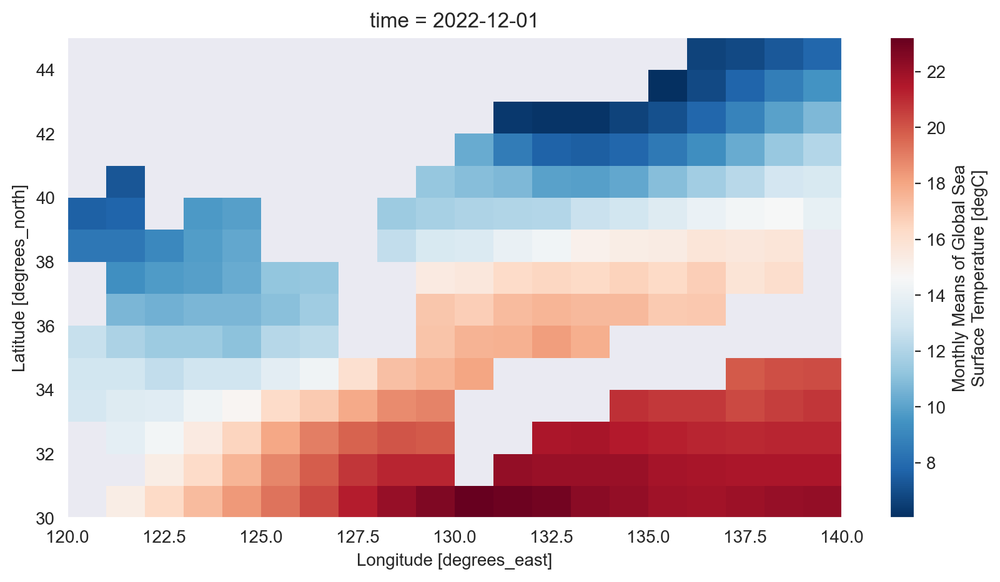

In [111]:
# you can plot the snapshot of dataset
snapshot = datetime.datetime(2022, 12, 1, 0, 0, 0)
ds3.sel(time = snapshot).sst.plot(cmap='RdBu_r',figsize=(10,5))

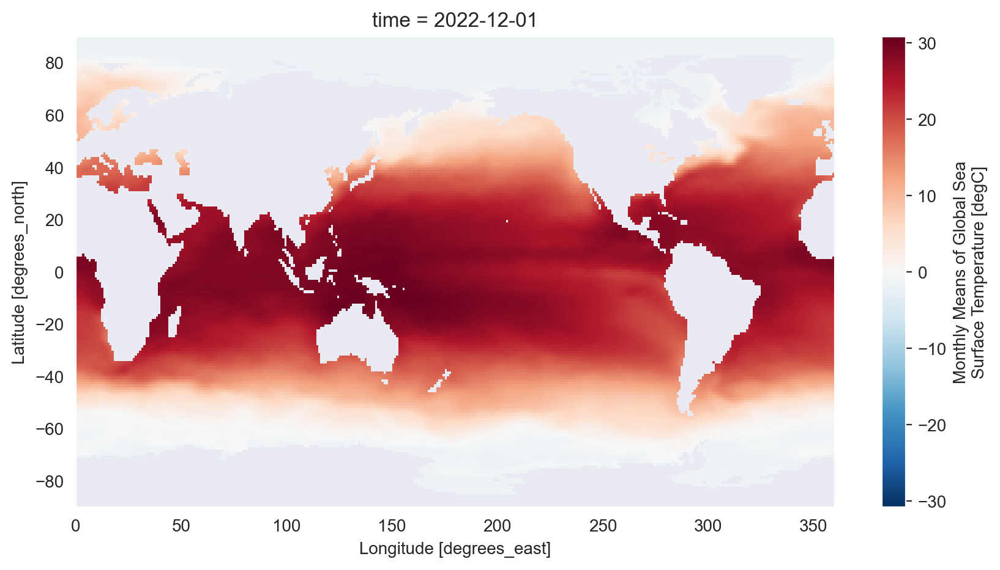

In [131]:
# you can plot the snapshot of dataset
snapshot = datetime.datetime(2022, 12, 1, 0, 0, 0)
ds.sel(time = snapshot).sst.plot(cmap='RdBu_r',figsize=(10,5))

In [112]:
# convert netcdf dataset into pandas dataframe by using xarray's to_dataframe
df = ds3.to_dataframe()
df.info()
df.head()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 3600 entries, (Timestamp('2022-01-01 00:00:00'), 44.5, 120.5) to (Timestamp('2022-12-01 00:00:00'), 30.5, 139.5)
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   sst     2364 non-null   float32
dtypes: float32(1)
memory usage: 26.1 KB


sst
time       lat  lon       
2022-01-01 44.5 120.5  NaN
                121.5  NaN
                122.5  NaN
                123.5  NaN
                124.5  NaN

In [113]:
# Latitude, longitude and time are indexed. 
# You can convert it to a general attribute column by using reset_index.
df = ds3.to_dataframe().reset_index()
df.info()
df.tail()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3600 entries, 0 to 3599
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   time    3600 non-null   datetime64[ns]
 1   lat     3600 non-null   float32       
 2   lon     3600 non-null   float32       
 3   sst     2364 non-null   float32       
dtypes: datetime64[ns](1), float32(3)
memory usage: 70.4 KB


,time,lat,lon,sst
3595,2022-12-01,30.5,135.5,21.897499
3596,2022-12-01,30.5,136.5,21.852501
3597,2022-12-01,30.5,137.5,21.965000
3598,2022-12-01,30.5,138.5,22.072500
3599,2022-12-01,30.5,139.5,22.162500


In [114]:
# drop null at 'sst' column 
df_nnull = df[df['sst'].notnull()]
# convert data type 
df_nnull['sst'] = df_nnull['sst'].astype(float)

C:\Users\Gaia3D\AppData\Local\Temp\ipykernel_6128\2579615975.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [115]:
# Make Point GeoDataFrame from lat, lon coordinates
# make point geometry
geom = gpd.points_from_xy(df_nnull.lon, df_nnull.lat)
gdf_pt4326 = gpd.GeoDataFrame(df_nnull, geometry=geom, crs='EPSG:4326')
gdf_pt4326.info()
gdf_pt4326.head()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 2364 entries, 16 to 3599
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   time      2364 non-null   datetime64[ns]
 1   lat       2364 non-null   float32       
 2   lon       2364 non-null   float32       
 3   sst       2364 non-null   float64       
 4   geometry  2364 non-null   geometry      
dtypes: datetime64[ns](1), float32(2), float64(1), geometry(1)
memory usage: 92.3 KB


,time,lat,lon,sst,geometry
16,2022-01-01,44.5,136.5,4.140001,POINT (136.50000 44.50000)
17,2022-01-01,44.5,137.5,3.992501,POINT (137.50000 44.50000)
18,2022-01-01,44.5,138.5,3.752501,POINT (138.50000 44.50000)
19,2022-01-01,44.5,139.5,4.035001,POINT (139.50000 44.50000)
35,2022-01-01,43.5,135.5,4.190001,POINT (135.50000 43.50000)


In [116]:
import plotly.express as px  # interactive chart package
#pip install plotly nbformat

In [117]:
# plotly map need mapbaox API
f = open('../../etc/mapbox.txt', 'r')
lines = f.readlines()
MAPBOX_API_KEY = lines[0].replace('"','')  #문자열의 쌍따옴표 제거
px.set_mapbox_access_token(MAPBOX_API_KEY)

In [134]:
# time animation map 
fig = px.scatter_mapbox(df_nnull, lat="lat", lon="lon", color="sst",  size='sst', size_max=35,
                        color_continuous_scale=px.colors.cyclical.IceFire,
                        animation_frame = 'time', # time animation 
                        zoom=5, center = {"lat": df.lat.mean(), "lon": df.lon.mean()},  #{"lat": df.lat.mean(), "lon": df.lon.mean()}
                        width=800, height=500  )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [119]:
# Transform the coordinate system to display a map with a base map
gdf_pt3857 = gdf_pt4326.to_crs(3857)

In [120]:
# package for basemap 
import contextily as ctx

In [121]:
# for using min, max of Colormap
vmin = gdf_pt3857['sst'].min()
vmax = gdf_pt3857['sst'].max()

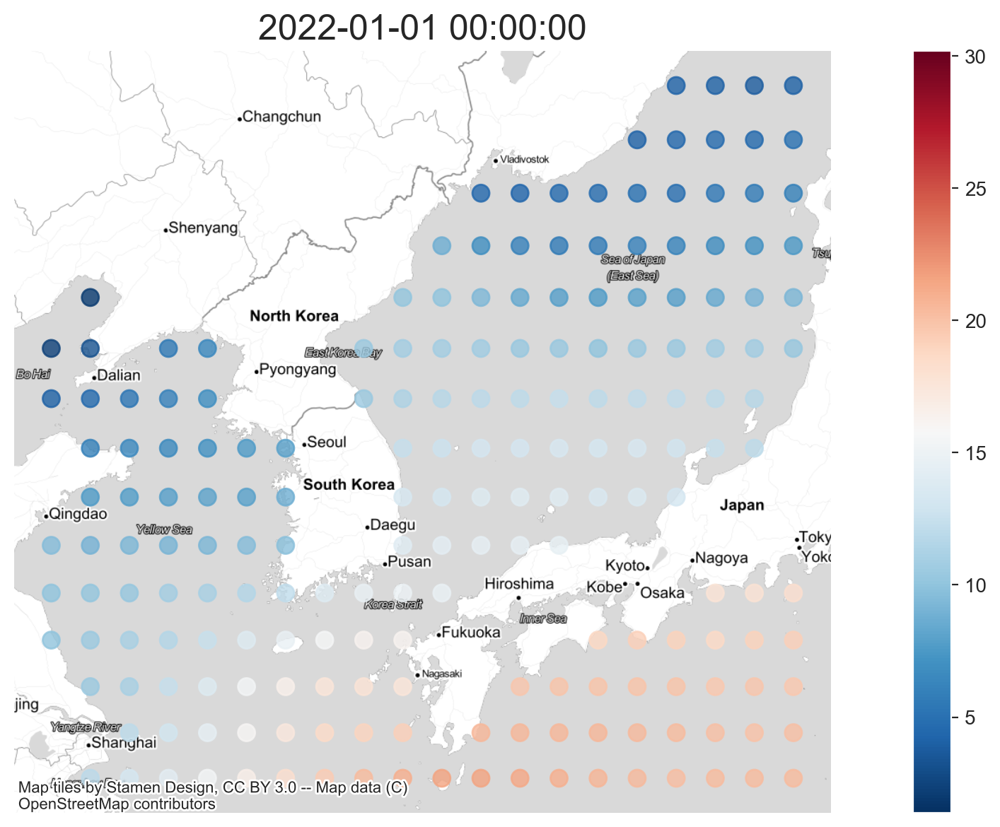

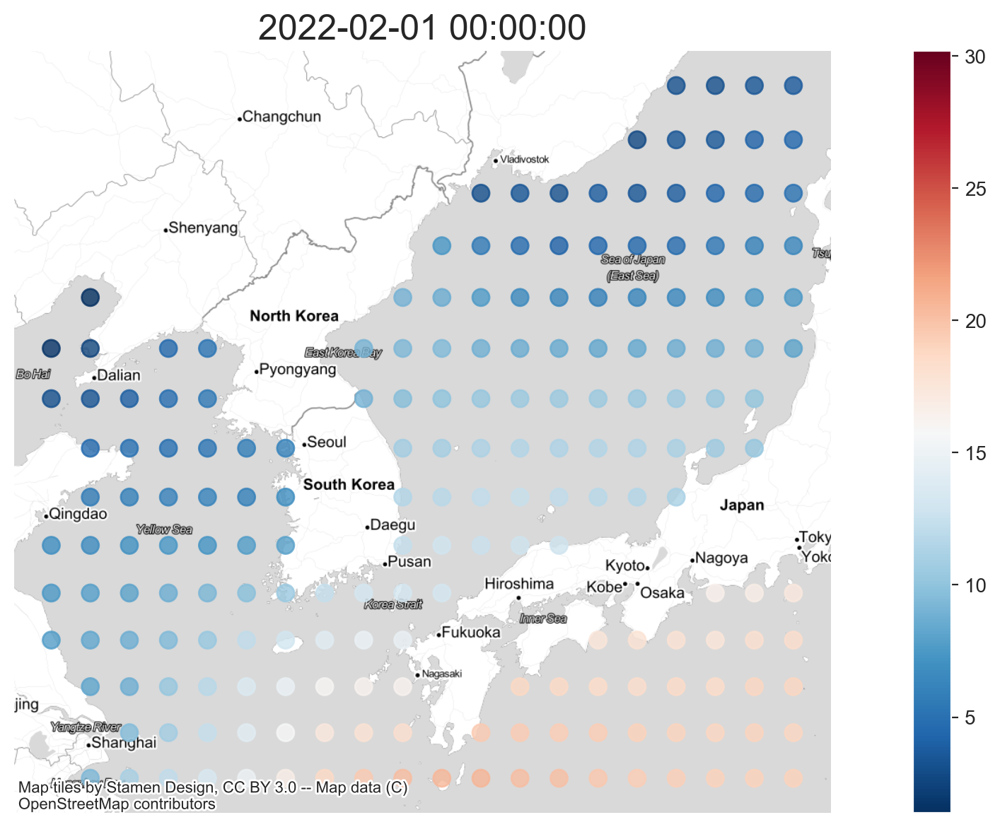

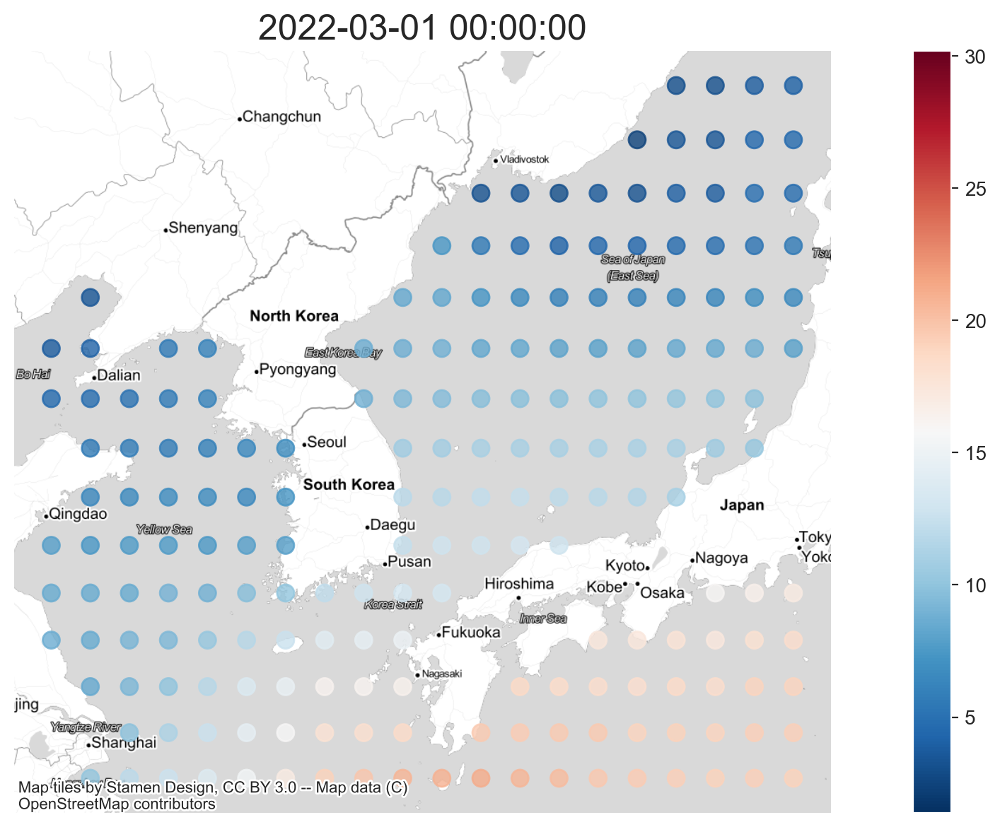

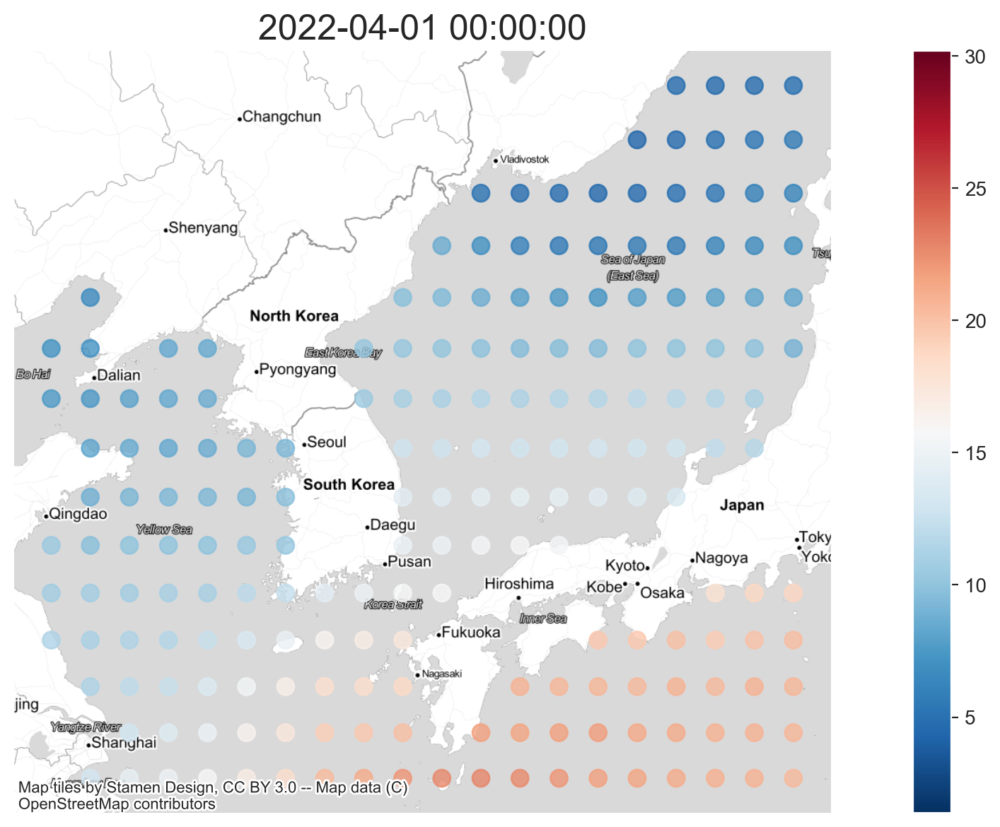

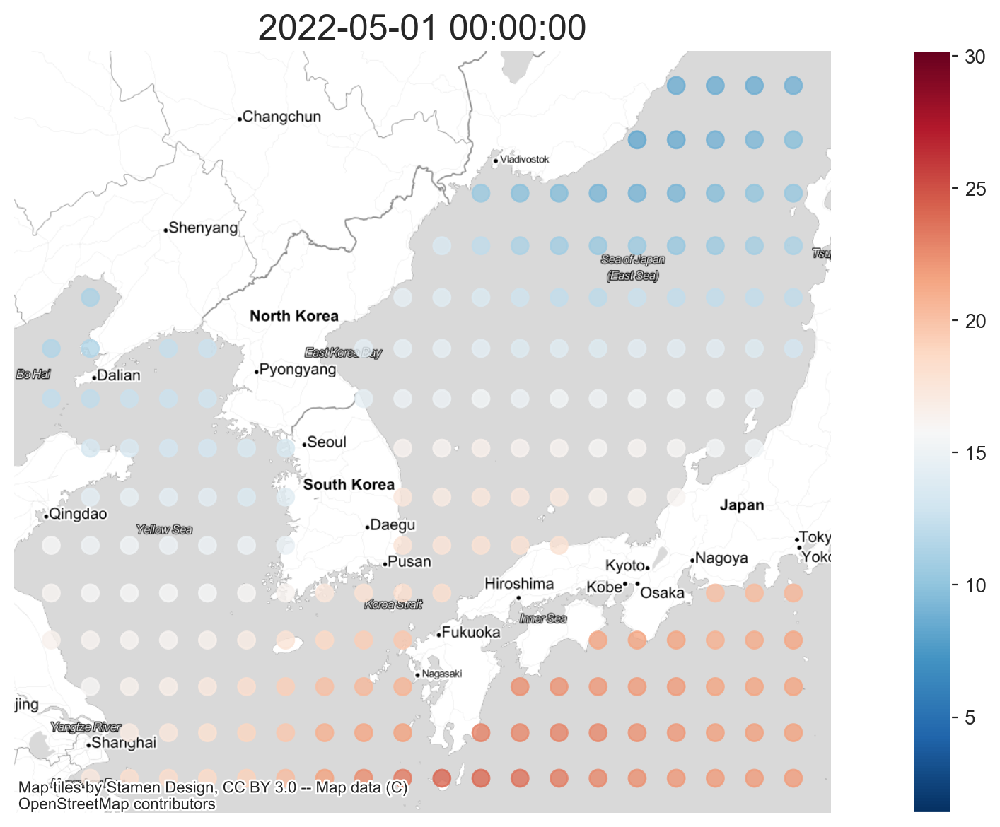

...

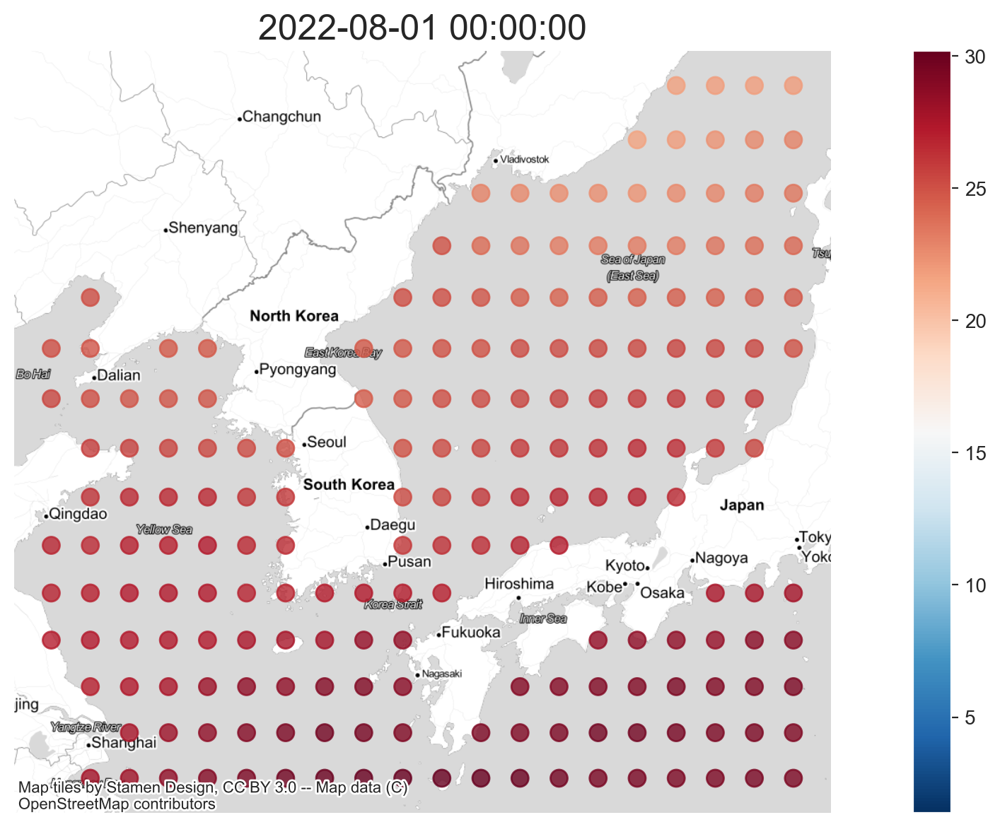

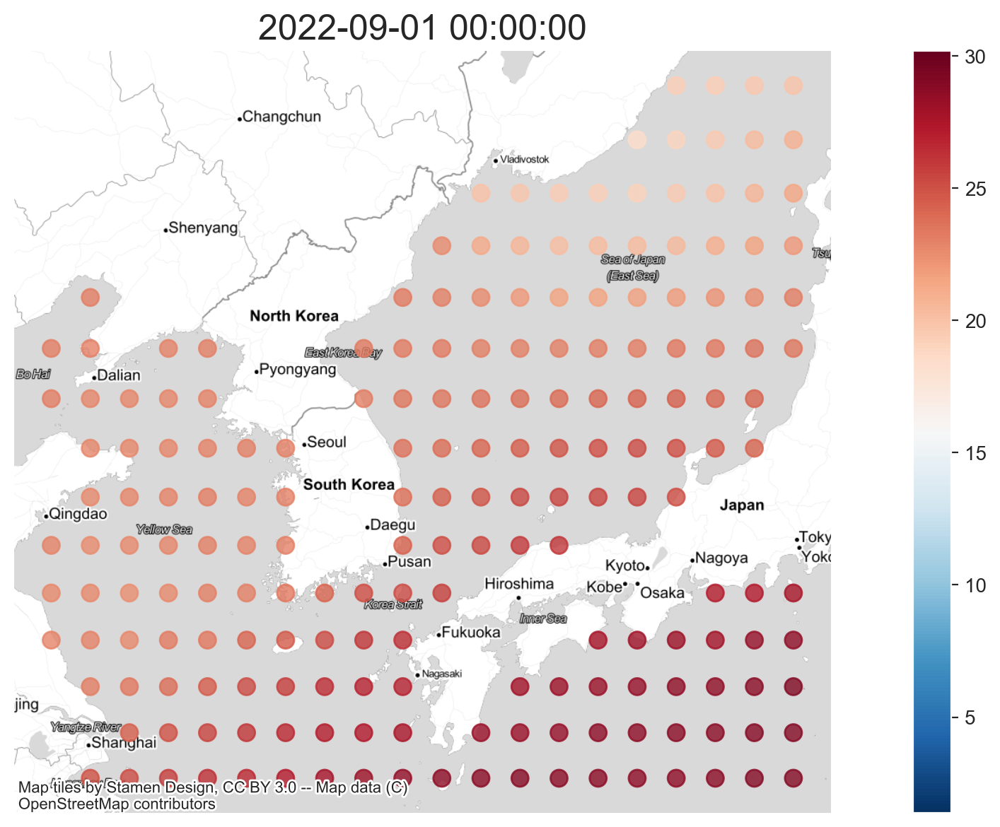

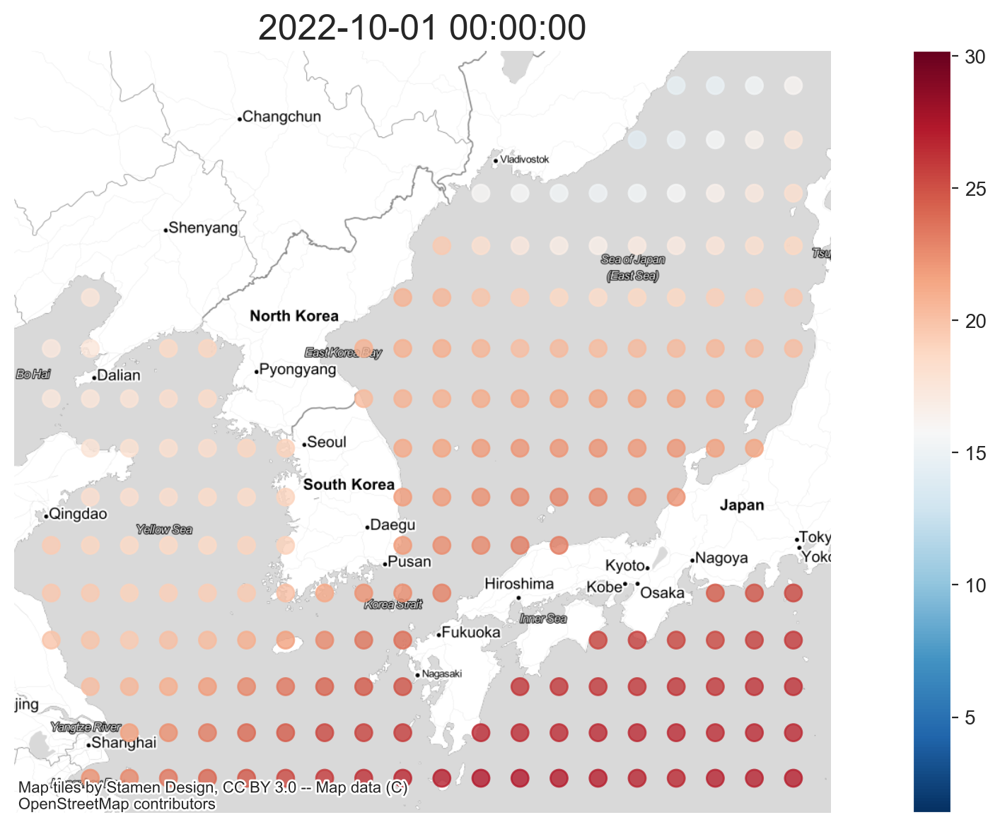

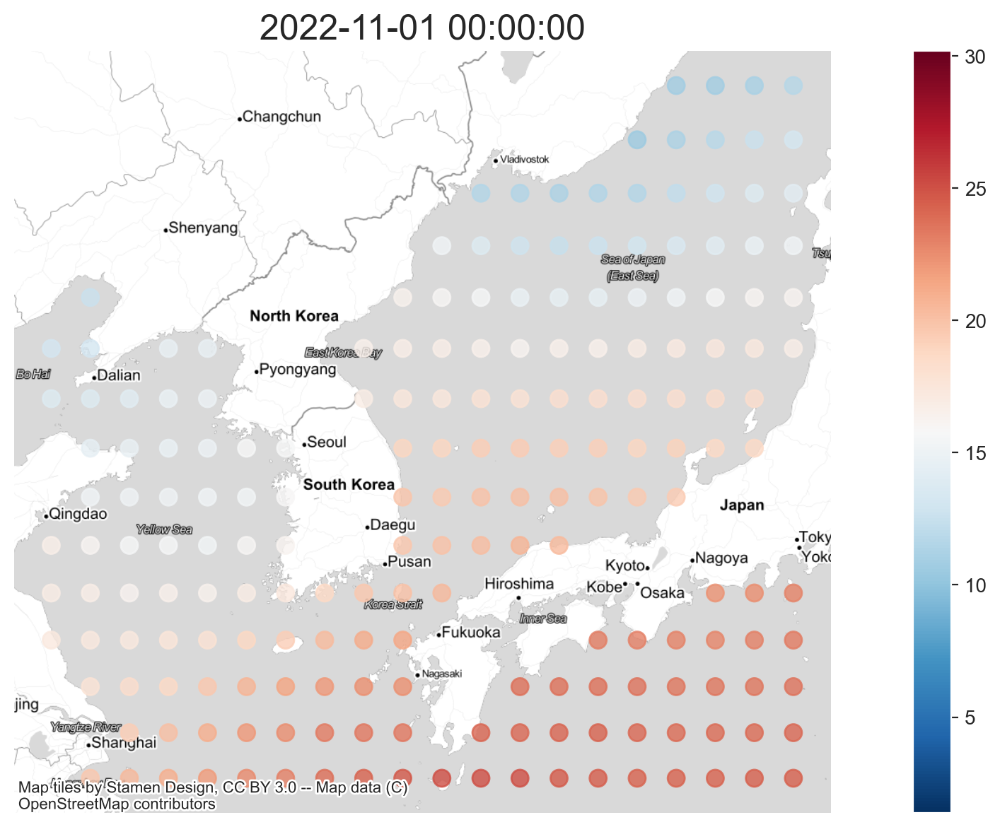

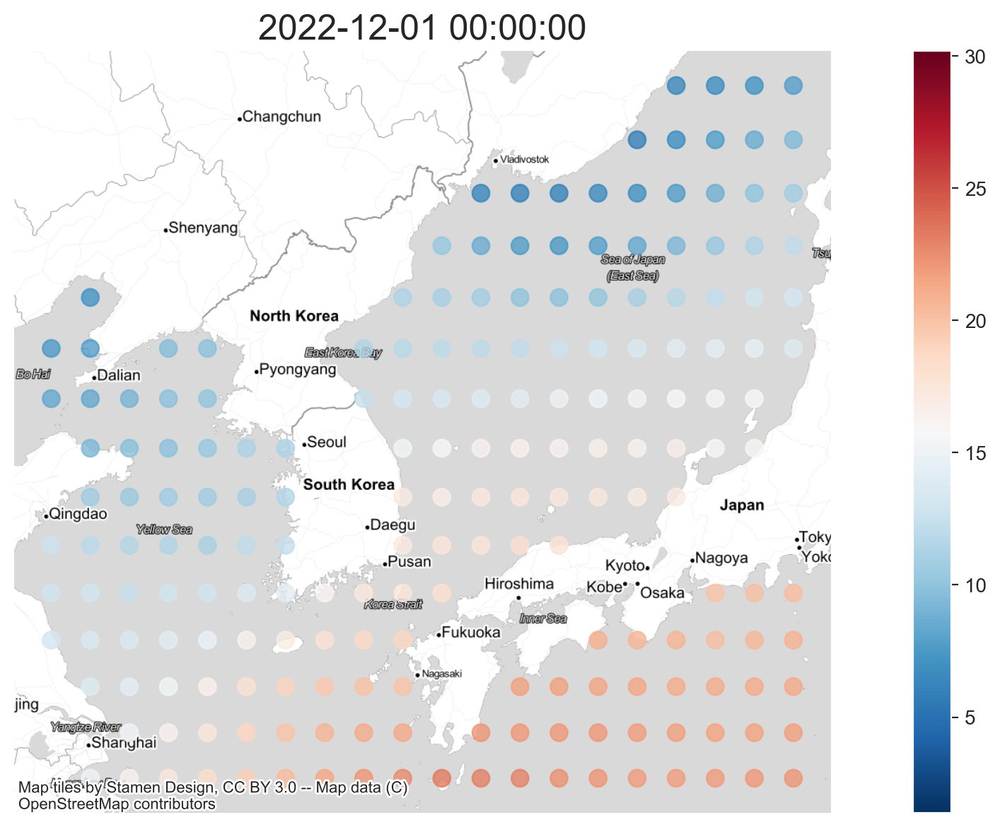

In [122]:
# make month's period
months = pd.date_range(start='2022-01-01', end='2022-12-01', freq='MS')

for start_date in months:
    if start_date.month == 12:  # 12월인 경우
        end_date = pd.Timestamp('2022-12-31')
    else:
        end_date = start_date + pd.offsets.MonthBegin(1) - pd.Timedelta(days=1)
    
    # extract month's data
    monthly_data = gdf_pt3857[(gdf_pt3857['time'] >= start_date) & (gdf_pt3857['time'] <= end_date)]
    # plot choropleth map
    ax = monthly_data.plot(markersize=75, column='sst', cmap='RdBu_r', 
        legend=True, figsize=(15, 7), alpha=0.8, vmin=vmin, vmax=vmax)  #, scheme='Fisher_Jenks', k=5
    # add basemap
    ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite)  #ctx.sources.ST_TONER_LITE
    ax.set_axis_off()
    # plt.show()
    filename = f"data_{start_date.strftime('%Y_%m')}.png"    
    plt.title(str(start_date), fontsize=18)
    # save map image
    plt.savefig("images/" + filename, bbox_inches='tight', pad_inches=0.01)


In [123]:
from pathlib import Path
import imageio    #!pip install imageio

In [124]:
image_path = Path('images') ## set folder
images = list(image_path.glob('*.png'))  # make png file list in image_path
image_list = []   
for file_name in images:  # make list for Animated GIF 
    image_list.append(imageio.imread(file_name))

# make Animated GIF 
imageio.mimwrite('images/point.gif', image_list, duration=1500, loop=True ) #fps는 초 단위    

C:\Users\Gaia3D\AppData\Local\Temp\ipykernel_6128\563798195.py:5: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



In [125]:
# user function for make grid ploygon by 1 degree
def create_polygon(lat, lon):
    return Polygon([(lon, lat),
                    (lon + 1, lat),
                    (lon + 1, lat + 1),
                    (lon, lat + 1)])

In [126]:
# Make polygon geometry with "create_polygon" function
geom_pg = df.apply(lambda row: create_polygon(row['lat'], row['lon']), axis=1)

# Make Polygon GeoDataFrame with DataFrame & Polygon geometry
gdf_pg4326 = gpd.GeoDataFrame(df, geometry=geom_pg, crs='4326')

In [127]:
# Transform the coordinate system to display a map with a base map
gdf_pg3857 = gdf_pg4326.to_crs(3857)

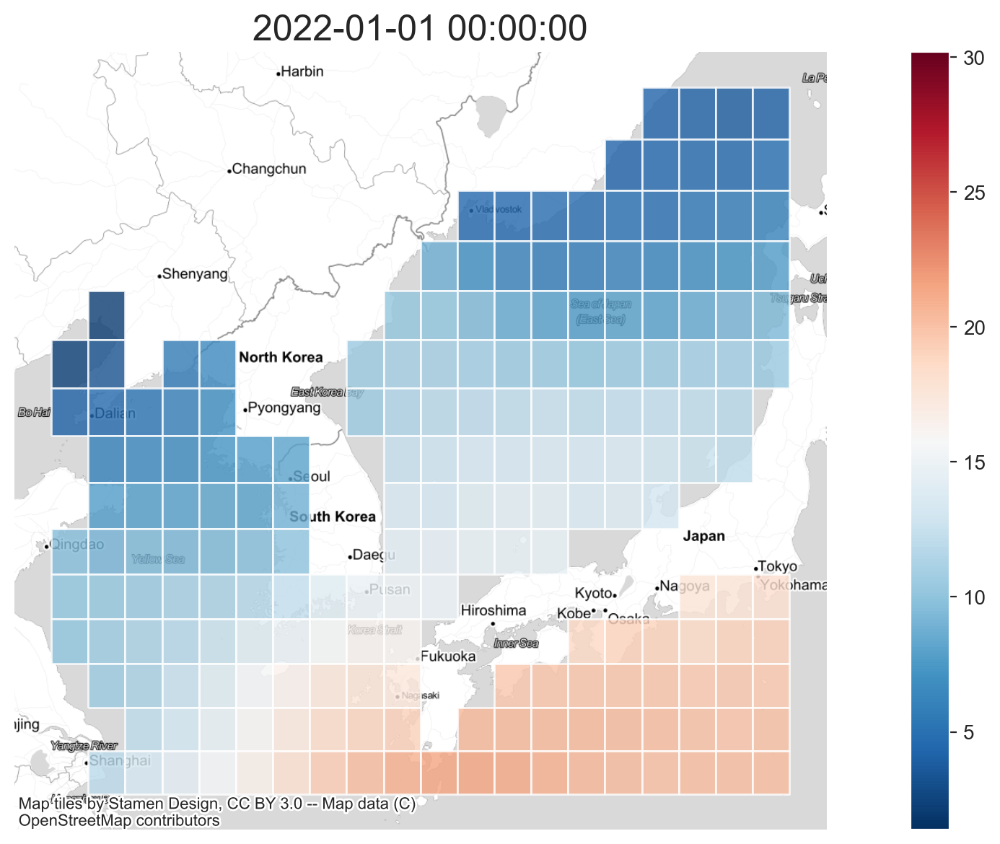

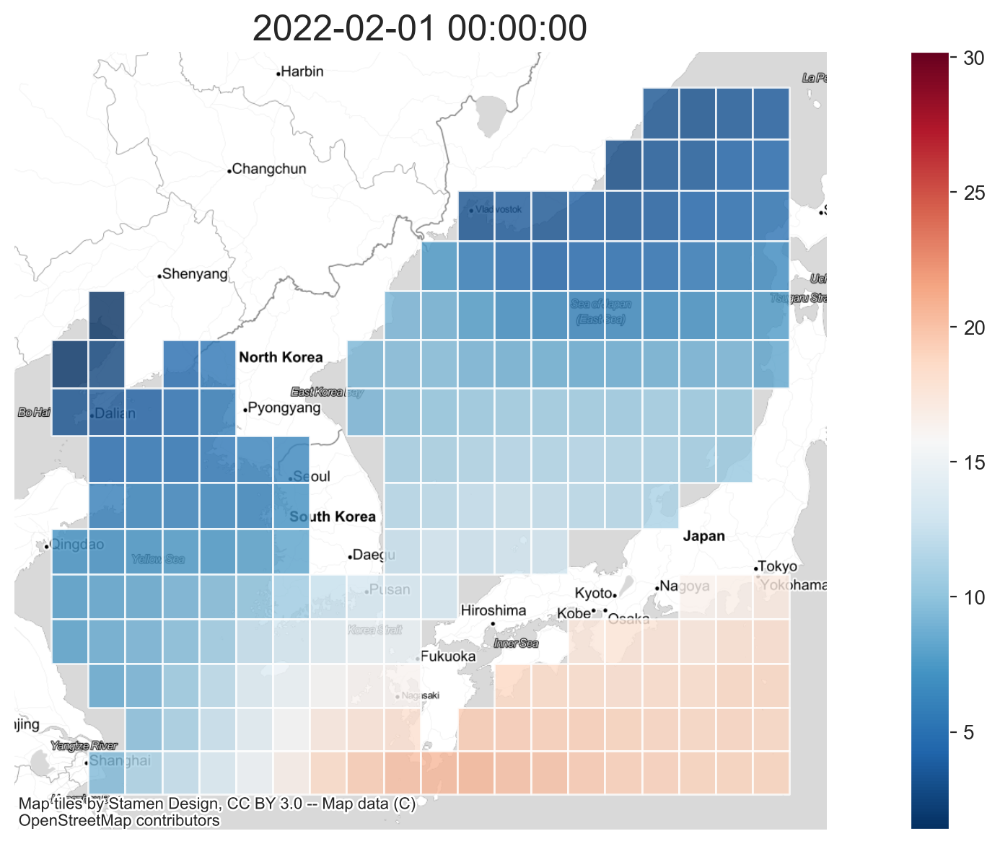

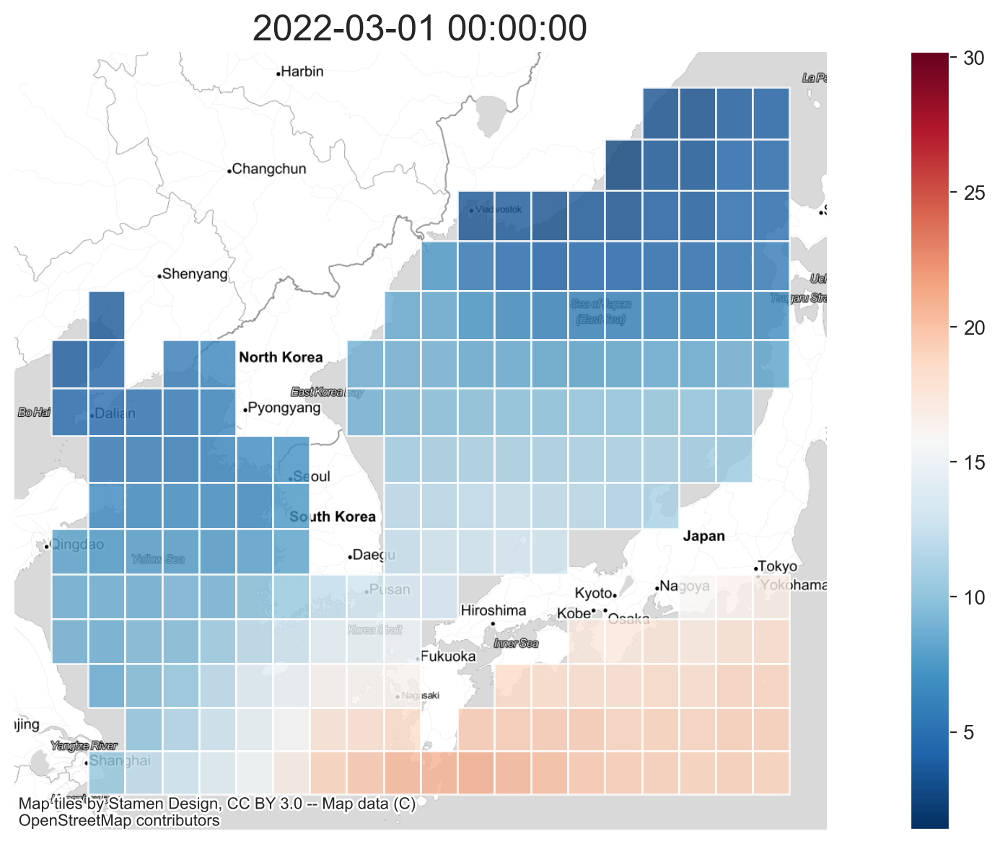

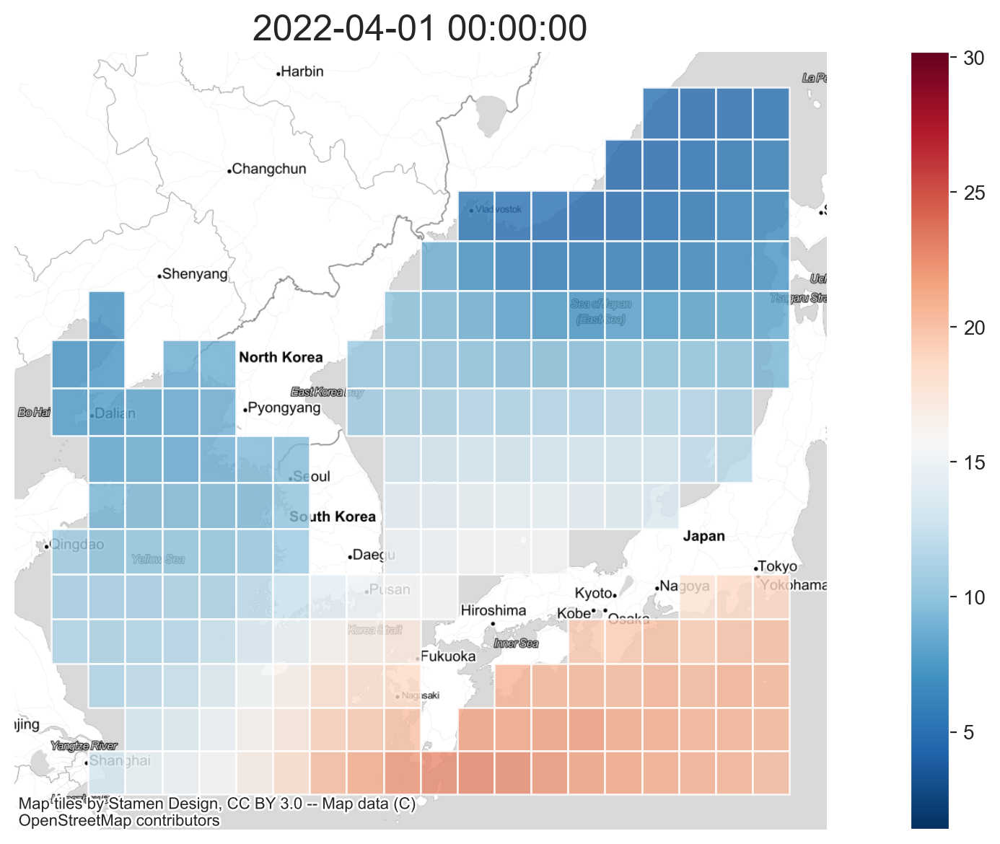

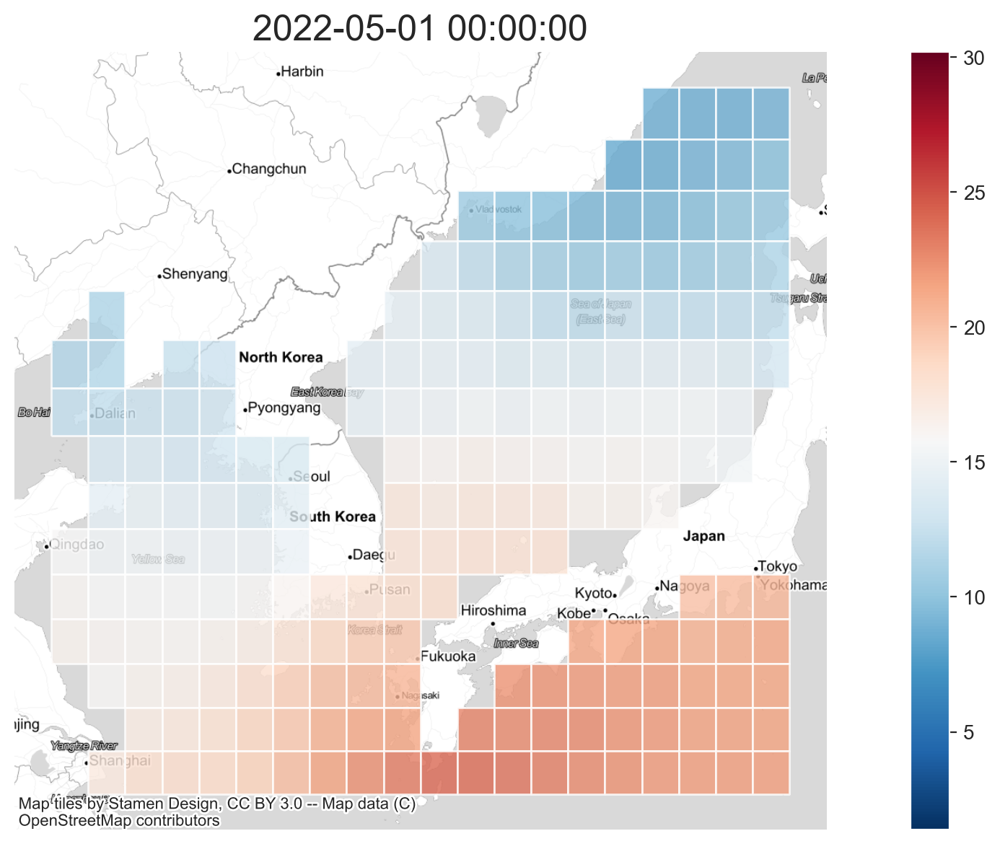

...

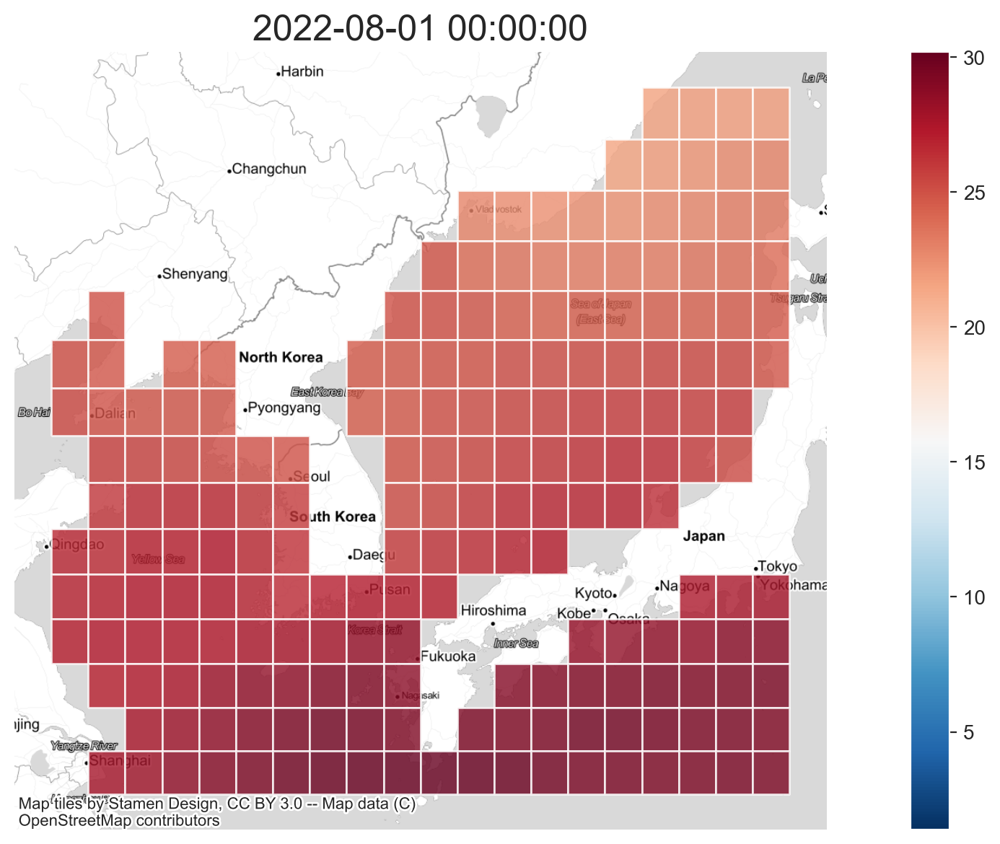

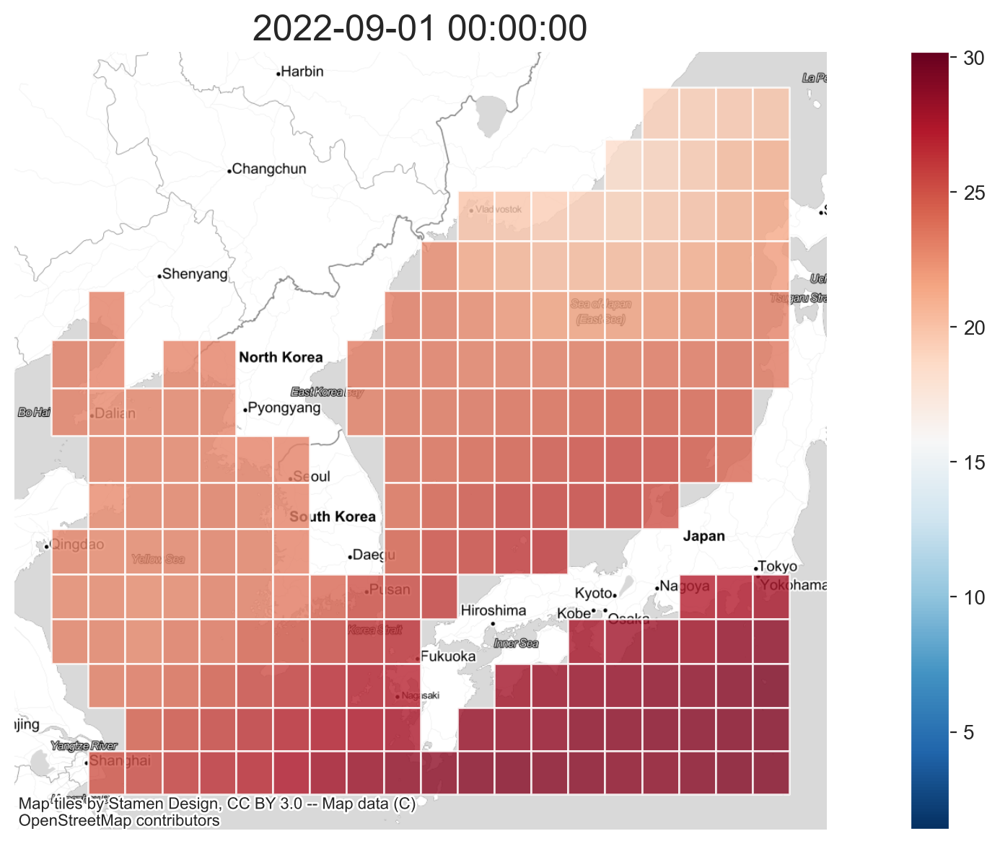

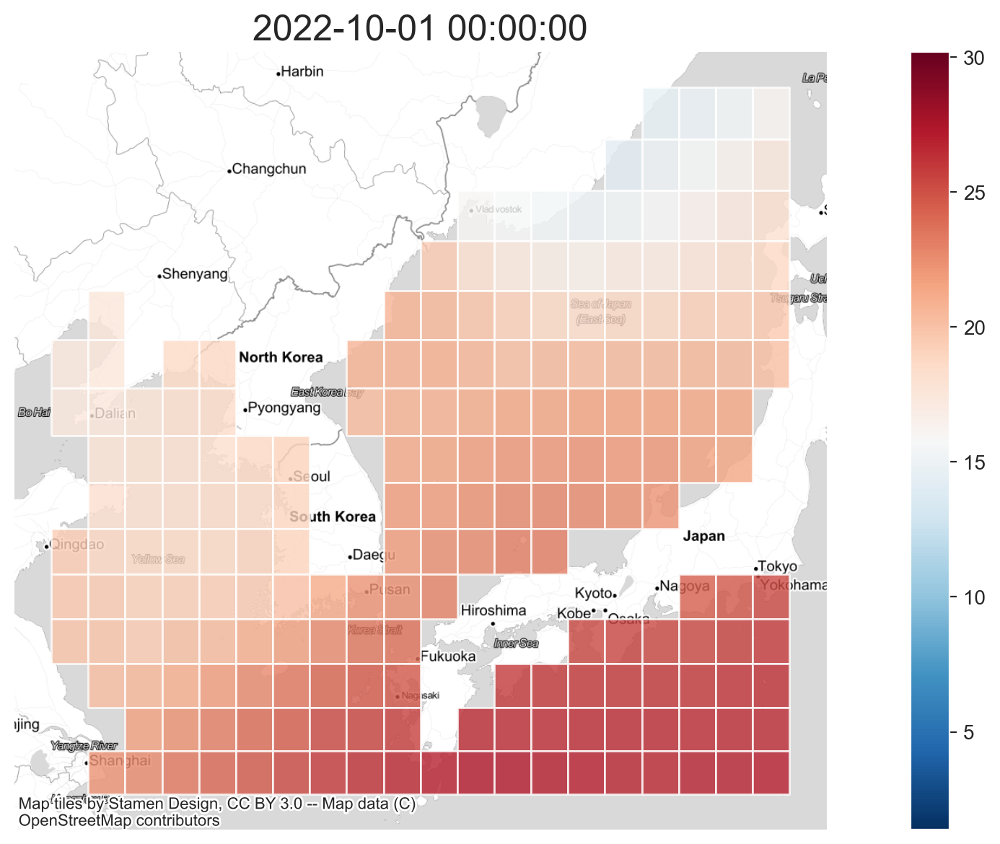

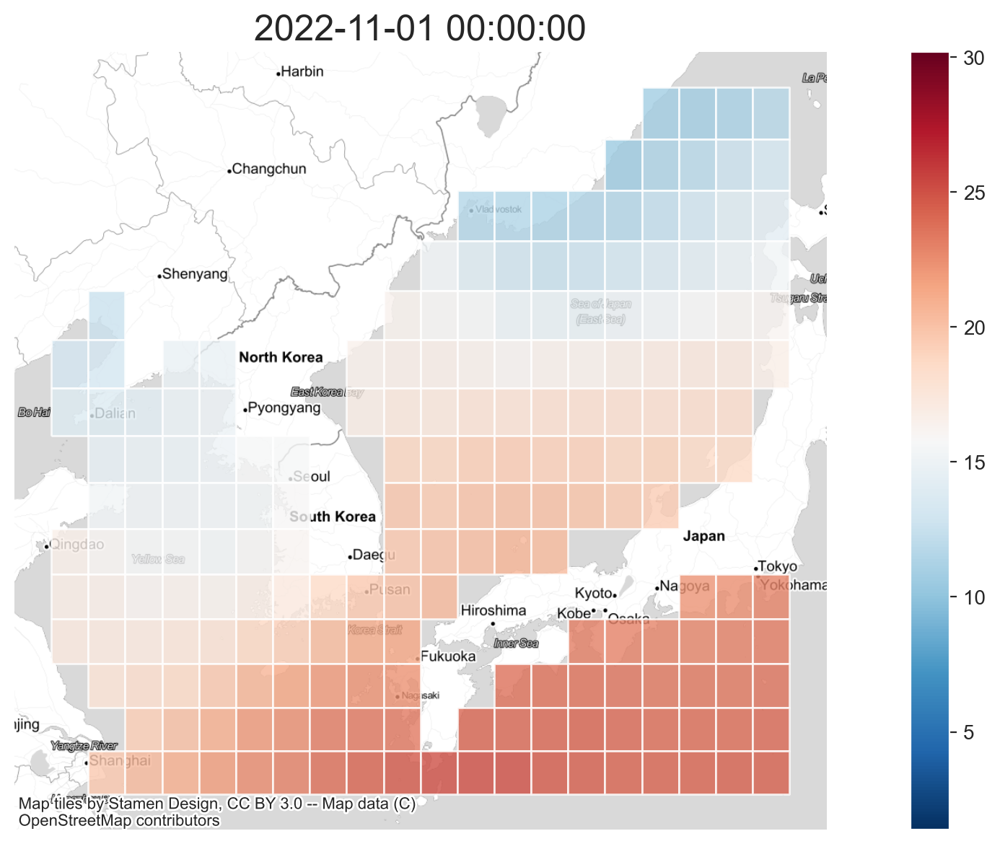

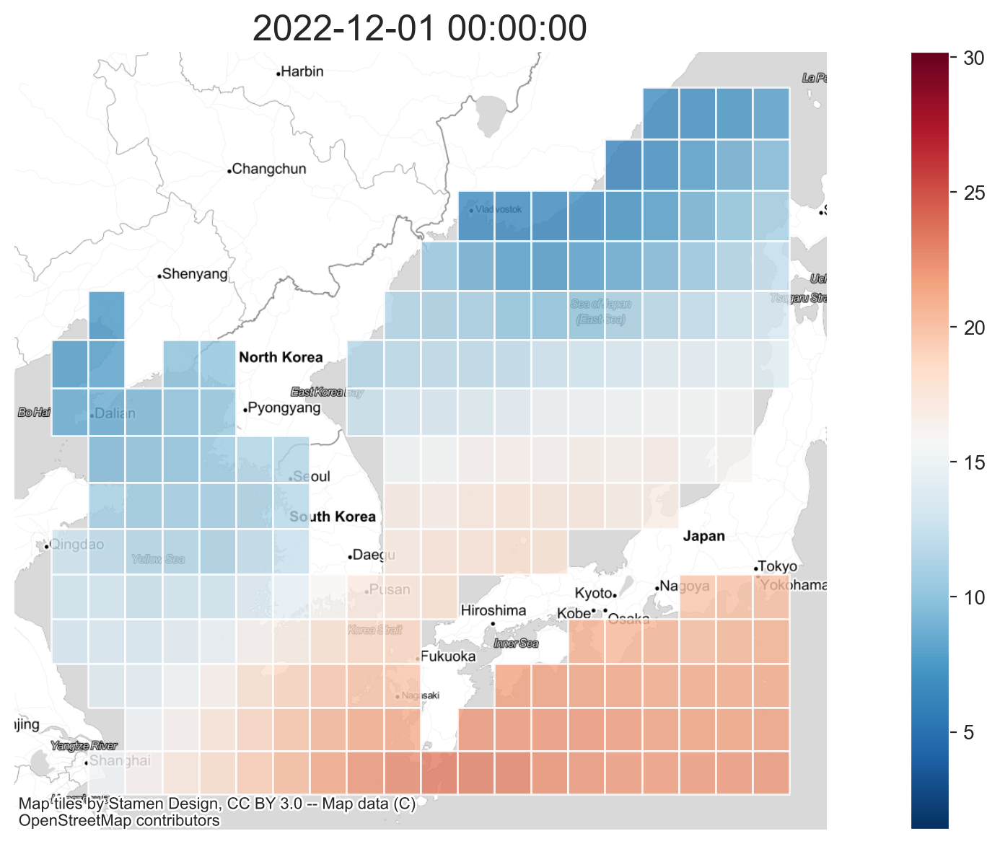

In [128]:
# make month's period
months = pd.date_range(start='2022-01-01', end='2022-12-01', freq='MS')

for start_date in months:
    if start_date.month == 12:  # 12월인 경우
        end_date = pd.Timestamp('2022-12-31')
    else:
        end_date = start_date + pd.offsets.MonthBegin(1) - pd.Timedelta(days=1)
    
    # extract month's data
    monthly_data = gdf_pg3857[(gdf_pg3857['time'] >= start_date) & (gdf_pg3857['time'] <= end_date)]
    # plot choropleth map with 'sst'
    ax = monthly_data.plot(column='sst', cmap='RdBu_r', 
        legend=True, figsize=(15, 7), alpha=0.8, vmin=vmin, vmax=vmax)  #, scheme='Fisher_Jenks', k=5
    # add basemap
    ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite)  
    ax.set_axis_off()
    # plt.show()
    filename = f"data_{start_date.strftime('%Y_%m')}.png"    
    plt.title(str(start_date), fontsize=18) #add title 
    # save map image
    plt.savefig("images2/" + filename, bbox_inches='tight', pad_inches=0.01)


In [129]:
image_path = Path('images2') # set folder
images = list(image_path.glob('*.png'))  # make png file list in image_path
image_list = []   
for file_name in images:  # make list for Animated GIF 
    image_list.append(imageio.imread(file_name))

# make Animated GIF 
imageio.mimwrite('images2/polygon.gif', image_list, duration=1500, loop=True )    

C:\Users\Gaia3D\AppData\Local\Temp\ipykernel_6128\325060383.py:5: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



In [130]:
# save shp file
gdf_pt3857.to_file('shp/gdf_pt3857.gpkg', driver="GPKG")
gdf_pg3857.to_file('shp/gdf_pg3857.gpkg', driver="GPKG")